# Market Risks Of Mutual Funds.

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from pandas_profiling import ProfileReport

In [4]:
data = pd.read_csv('Nifty 50.csv')
data['Date'] = pd.to_datetime(data['Date'])
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day

In [5]:
data.head()

,Date,Open,High,Low,Close,Volume,Turnover,P/E,P/B,Div Yield,year,month,day
0,2000-01-03,1482.15,1592.90,1482.15,1592.2,25358322,8.841500e+09,25.91,4.63,0.95,2000,1,3
1,2000-01-04,1594.40,1641.95,1594.40,1638.7,38787872,1.973690e+10,26.67,4.76,0.92,2000,1,4
2,2000-01-05,1634.55,1635.50,1555.05,1595.8,62153431,3.084790e+10,25.97,4.64,0.95,2000,1,5
3,2000-01-06,1595.80,1639.00,1595.80,1617.6,51272875,2.531180e+10,26.32,4.70,0.94,2000,1,6
4,2000-01-07,1616.60,1628.25,1597.20,1613.3,54315945,1.914630e+10,26.25,4.69,0.94,2000,1,7


In [9]:
report = ProfileReport(data)

In [10]:
report

Render HTML: 100%|██████████| 1/1 [00:04<00:00,  4.53s/it]


## Nifty in Last 2 Decades

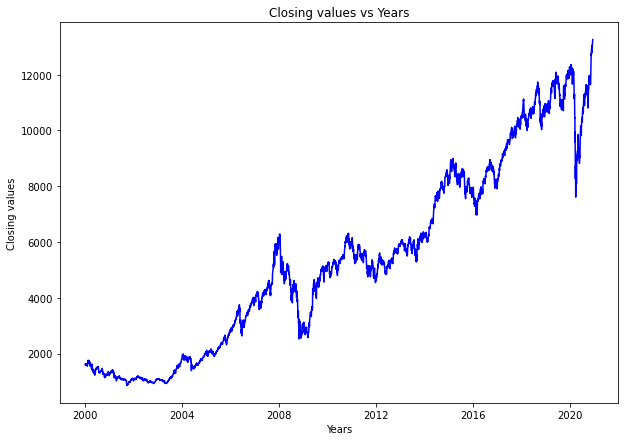

In [14]:
plt.figure(figsize=(10,7))
plt.plot(data['Date'],data['Close'],color='b')
plt.xlabel('Years')
plt.ylabel('Closing values')
plt.title('Closing values vs Years')
plt.show()

## What years had the highest 5 peaks? ---> 2015,2017,2018,2019,2020

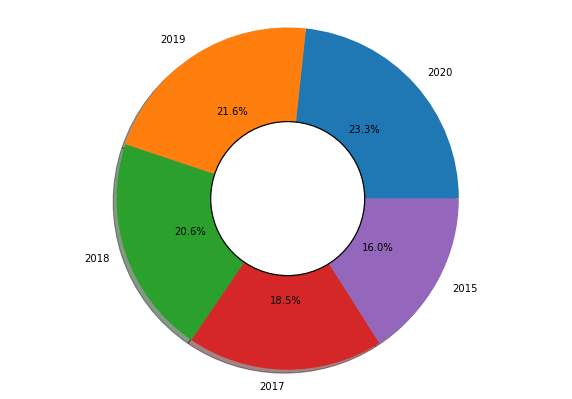

In [15]:
peaks = data.loc[:, ['year','High']]
peaks['max_high'] = peaks.groupby('year')['High'].transform('max')
peaks.drop('High', axis=1, inplace=True)
peaks = peaks.drop_duplicates()
peaks = peaks.sort_values('max_high', ascending=False)
peaks = peaks.head()

fig = plt.figure(figsize=(10,7))
plt.pie(peaks['max_high'], labels=peaks['year'], autopct='%1.1f%%', shadow=True)
centre_circle = plt.Circle((0,0),0.45,color='black', fc='white',linewidth=1.25)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.show()

## From the above donut plot it seems that the prices were low in the year 2016 Distribution of the highest values

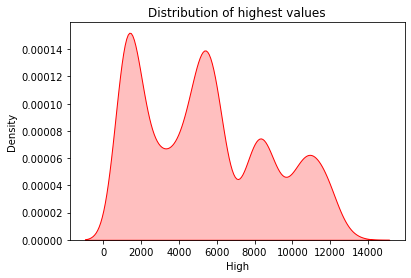

In [17]:
sns.kdeplot(data=data['High'], shade=True, color='red')
plt.title('Distribution of highest values')
plt.show()

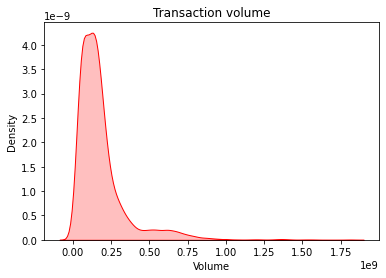

In [19]:
sns.kdeplot(data=data['Volume'], shade=True,color='red')
plt.title('Transaction volume')
plt.show()

In [20]:
top_5_genres = [1,3,5,7,9,11]
perc = data.loc[:,["year","month",'Volume']]
perc['new_volume'] = perc.groupby([perc.month,perc.year])['Volume'].transform('mean')
perc.drop('Volume', axis=1, inplace=True)
perc = perc[perc.year<2020]
perc = perc.drop_duplicates()
perc = perc.loc[perc['month'].isin(top_5_genres)]
perc = perc.sort_values("year")

fig=px.bar(perc,x='month', y="new_volume", animation_frame="year", 
           animation_group="month", color="month", hover_name="month", range_y=[perc['new_volume'].min(), perc['new_volume'].max()])
fig.update_layout(showlegend=False)
fig.show()

## Relation of Volume to stock prices

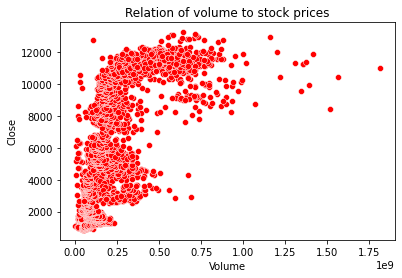

In [23]:
sns.scatterplot(data=data, x='Volume', y='Close',color='red')
plt.title('Relation of volume to stock prices')
plt.show()

## Distribution of the P/E ratio

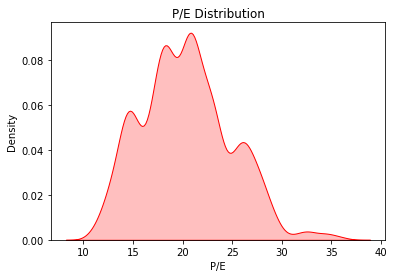

In [22]:
sns.kdeplot(data=data['P/E'], shade=True,color='red')
plt.title('P/E Distribution')
plt.show()

## Relation of P/E ratio to Close values

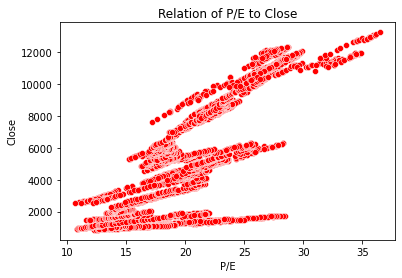

In [26]:
sns.scatterplot(data=data, x='P/E', y='Close',color='red')
plt.title('Relation of P/E to Close')
plt.show()

## Yearly graph of P/E

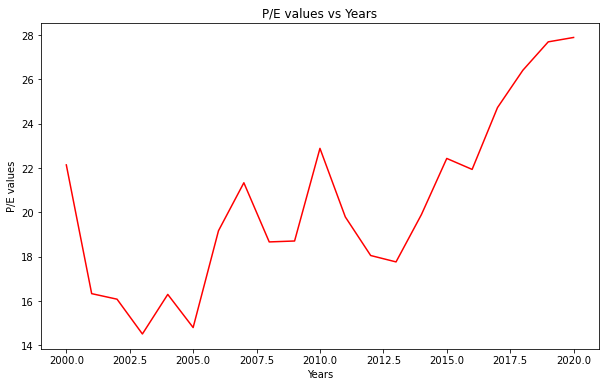

In [30]:
df = data.loc[:,['year','P/E']]
df['meanPE'] = df.groupby('year')['P/E'].transform('mean')
df.drop('P/E',axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,6))
plt.plot(df['year'],df['meanPE'],color='red')
plt.xlabel('Years')
plt.ylabel('P/E values')
plt.title('P/E values vs Years')
plt.show()

## Distribution of P/B

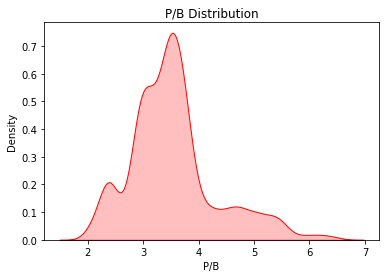

In [34]:
sns.kdeplot(data=data['P/B'], shade=True,color='red')
plt.title('P/B Distribution')
plt.show()

## Relation of P/B to Close values

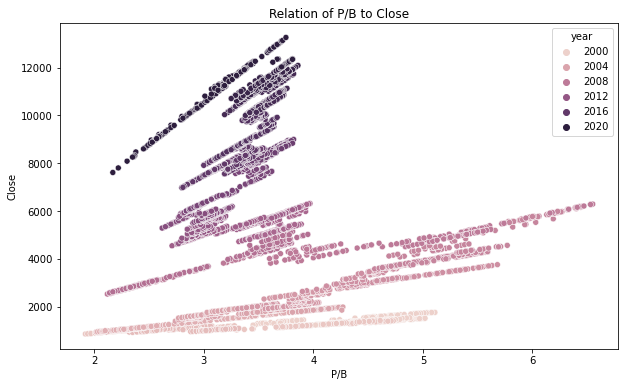

In [37]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=data, x='P/B', y='Close', hue='year')
plt.title('Relation of P/B to Close')
plt.show()

## Yearly graph of P/B

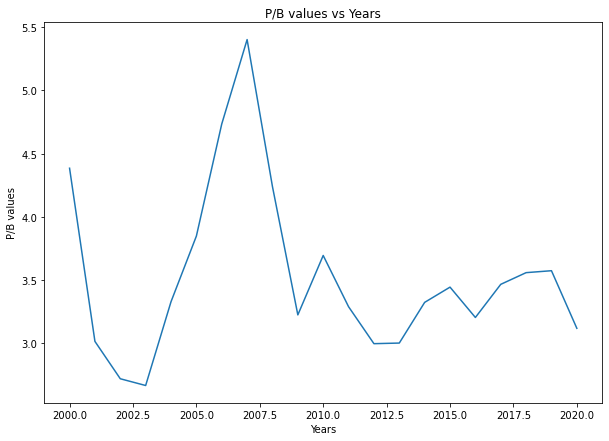

In [38]:
df = data.loc[:,['year','P/B']]
df['meanPB'] = df.groupby('year')['P/B'].transform('mean')
df.drop('P/B',axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,7))
plt.plot(df['year'],df['meanPB'])
plt.xlabel('Years')
plt.ylabel('P/B values')
plt.title('P/B values vs Years')
plt.show()

## Distribution of Dividend Yield

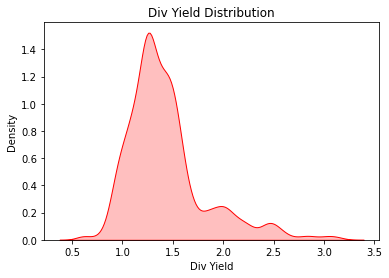

In [39]:
sns.kdeplot(data=data['Div Yield'], shade=True,color='red')
plt.title('Div Yield Distribution')
plt.show()

##  Relation of Dividend yield to Closing stock prices¶

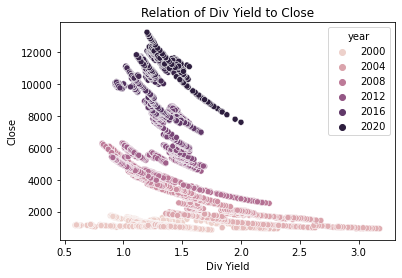

In [40]:
sns.scatterplot(data=data, x='Div Yield', y='Close', hue='year')
plt.title('Relation of Div Yield to Close')
plt.show()

## Dividend yield per year

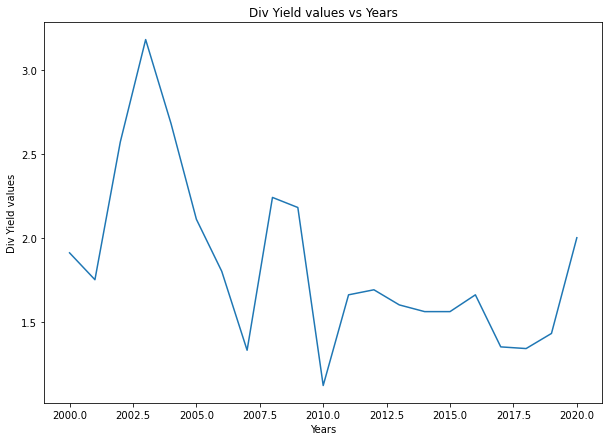

In [41]:
df = data.loc[:,['year','Div Yield']]
df['meandiv'] = df.groupby('year')['Div Yield'].transform('max')
df.drop('Div Yield',axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,7))
plt.plot(df['year'],df['meandiv'])
plt.xlabel('Years')
plt.ylabel('Div Yield values')
plt.title('Div Yield values vs Years')
plt.show()

## P/E - P/B - Div Yield vs Years

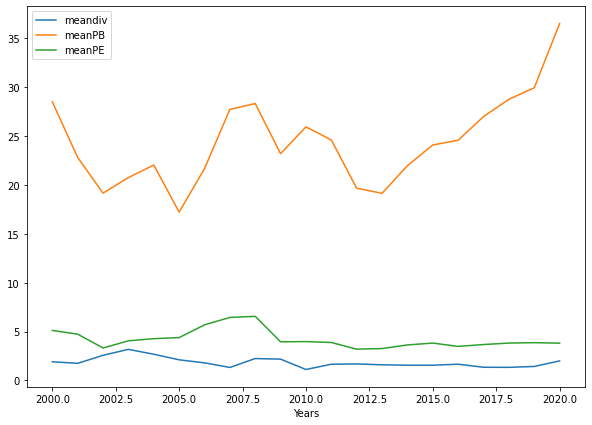

In [42]:
df = data.loc[:,['year','P/B','P/E','Div Yield']]
df[['meanPE','meanPB','meandiv']] = df.groupby('year')[['P/B','P/E','Div Yield']].transform('max')
df.drop(['P/B','P/E','Div Yield'],axis=1, inplace=True)
df = df.drop_duplicates().sort_values('year')


plt.figure(figsize=(10,7))
plt.plot(df['year'],df['meandiv'], label='meandiv')
plt.plot(df['year'],df['meanPB'], label='meanPB')
plt.plot(df['year'],df['meanPE'], label='meanPE')
plt.xlabel('Years')
plt.legend()
plt.show()

In [43]:
df5 = data[(data['year']>=2005) & (data['year']<=2009)]

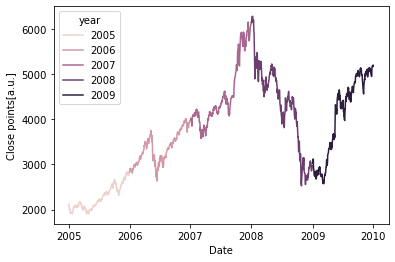

In [44]:
sns.lineplot(data=df5, x='Date', y='Close', hue='year')
plt.ylabel('Close points[a.u.]')
plt.show()

## Only for the year 2008

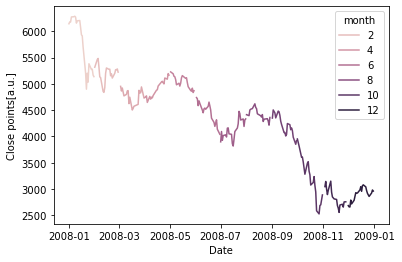

In [45]:
df8 = data[data['year']==2008]
sns.lineplot(data=df8, x='Date', y='Close', hue='month')
plt.ylabel('Close points[a.u.]')
plt.show()

In [46]:
## Only for the year 2006

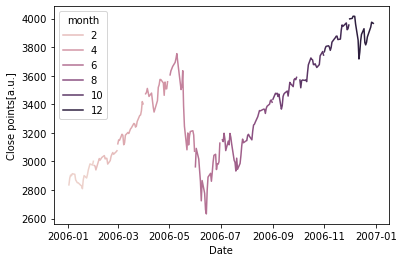

In [47]:
df6 = data[data['year']==2006]
sns.lineplot(data=df6, x='Date', y='Close', hue='month')
plt.ylabel('Close points[a.u.]')
plt.show()